<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ резюме из HeadHunter
   

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [2]:
#ваш код здесь
path = 'data/dst-3.0_16_1_hh_database.csv'
hh_data = pd.read_csv(path, sep=';')

2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [3]:
#ваш код здесь
hh_df = hh_data.copy()
hh_df.head(3)

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

4. Обратите внимание на информацию о числе непустых значений.

In [4]:
#ваш код здесь
hh_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

5. Выведите основную статистическую информацию о столбцах.


In [5]:
#ваш код здесь
hh_df.describe()

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [6]:
#ваш код здесь
def get_education(el):
    words = el.split()
    if words[1] == 'образование':
        return words[0]
    return ' '.join(words[:2])

hh_df['Образование'] = hh_df['Образование и ВУЗ'].apply(get_education)

hh_df = hh_df.drop(columns=['Образование и ВУЗ'])

In [7]:
# Сколько соискателей имеет средний уровень образования (школьное образование)?
hh_df['Образование'].value_counts()

Образование
Высшее                 33863
Среднее специальное     5765
Неоконченное высшее     4557
Среднее                  559
Name: count, dtype: int64

2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [8]:
#ваш код здесь
hh_df['Пол'] = hh_df['Пол, возраст'].apply(lambda el: el[0])
hh_df['Возраст'] = hh_df['Пол, возраст'].apply(lambda el: int(el.split(',')[1].split()[0]))

hh_df = hh_df.drop(columns=['Пол, возраст'])

In [9]:
# Сколько процентов женских резюме представлено в наших данных? Ответ округлите до сотых.
hh_df['Пол'].value_counts(normalize=True)*100

Пол
М    80.929287
Ж    19.070713
Name: proportion, dtype: float64

In [10]:
# Чему равен средний возраст соискателей? Ответ округлите до десятых.
hh_df['Возраст'].mean()

32.19674146254246

3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [11]:
#ваш код здесь
def get_experience(el):
    if pd.isna(el) or el == 'Не указано':
        return np.nan
    words = el.split()
    if words[5][:5] == 'месяц':
        return int(words[2]) * 12 + int(words[4])
    elif words[3][:5] == 'месяц':
        return int(words[2])
    else:
        return int(words[2]) * 12
hh_df['Опыт работы (месяц)'] = hh_df['Опыт работы'].apply(get_experience)

hh_df = hh_df.drop(columns=['Опыт работы'])

In [12]:
# Чему равен медианный опыт работы (в месяцах) в нашей таблице?
hh_df['Опыт работы (месяц)'].median()

100.0

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [13]:
#ваш код здесь
def get_city(el):
    million_cities = {'Новосибирск', 'Екатеринбург', 'Нижний Новгород', 'Казань', 
                      'Челябинск', 'Омск', 'Самара', 'Ростов-на-Дону', 'Уфа',
                      'Красноярск', 'Пермь', 'Воронеж', 'Волгоград' }
    city = el.split(' , ')[0]
    if city == 'Москва' or city == 'Санкт-Петербург':
        return city
    elif city in million_cities:
        return 'город-миллионник'
    return 'другие'

def ready2move(el):
    words = el.split(' ,')
    if words[1].lstrip()[:2] == 'м.':
        words[1] = words[2]
    if words[1].lstrip()[:2] == 'не':
        return False
    return True

def ready2businessMove(el):
    words = el.split(' ,')
    if words[-1].lstrip()[:2] == 'не':
        return False
    return True
    
hh_df['Город'] = hh_df['Город, переезд, командировки'].apply(get_city)
hh_df['Готовность к переезду'] = hh_df['Город, переезд, командировки'].apply(ready2move)
hh_df['Готовность к командировкам'] = hh_df['Город, переезд, командировки'].apply(ready2businessMove)

hh_df = hh_df.drop(columns='Город, переезд, командировки')

In [14]:
# Сколько процентов соискателей живут в Санкт-Петербурге? Ответ округлите до целого.
hh_df['Город'].value_counts(normalize=True)*100

Город
Москва              37.146880
другие              35.432684
город-миллионник    16.386555
Санкт-Петербург     11.033882
Name: proportion, dtype: float64

In [15]:
# Сколько процентов соискателей готовы одновременно и к переездам, и к командировкам? Ответ округлите до целого.
hh_df[['Готовность к переезду', 'Готовность к командировкам']].value_counts(normalize=True)*100

Готовность к переезду  Готовность к командировкам
False                  True                          38.847667
True                   True                          32.035580
False                  False                         25.337475
True                   False                          3.779278
Name: proportion, dtype: float64

5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [16]:
#ваш код здесь
def indicator(el, search='полная занятость'):
    words = el.split(', ')
    if search in words:
        return True
    return False

hh_df['полная занятость'] = hh_df['Занятость'].apply(indicator, args=('полная занятость', ))
hh_df['частичная занятость'] = hh_df['Занятость'].apply(indicator, args=('частичная занятость', ))
hh_df['проектная работа'] = hh_df['Занятость'].apply(indicator, args=('проектная работа', ))
hh_df['волонтёрство'] = hh_df['Занятость'].apply(indicator, args=('волонтерство', ))
hh_df['стажировка'] = hh_df['Занятость'].apply(indicator, args=('стажировка', ))
hh_df['полный день'] = hh_df['График'].apply(indicator, args=('полный день', ))
hh_df['сменный график'] = hh_df['График'].apply(indicator, args=('сменный график', ))
hh_df['гибкий график'] = hh_df['График'].apply(indicator, args=('гибкий график', ))
hh_df['удалённая работа'] = hh_df['График'].apply(indicator, args=('удалённая работа', ))
hh_df['вахтовый метод'] = hh_df['График'].apply(indicator, args=('вахтовый метод', ))
hh_df = hh_df.drop(columns=['Занятость', 'График'])

In [17]:
# Сколько людей ищут проектную работу и волонтёрство (в обоих столбцах стоит True)?
hh_df[['проектная работа', 'волонтёрство']].value_counts()

проектная работа  волонтёрство
False             False           36626
True              False            7632
                  True              436
False             True               50
Name: count, dtype: int64

In [18]:
# Сколько людей хотят работать вахтовым методом и с гибким графиком (в обоих столбцах стоит True)?
hh_df[['гибкий график', 'вахтовый метод']].value_counts()

гибкий график  вахтовый метод
False          False             28387
True           False             13273
               True               2311
False          True                773
Name: count, dtype: int64

6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [19]:
#ваш код здесь
path = 'data/ExchangeRates.csv'
exchange_data = pd.read_csv(path)
exchange_data.sample(3)

,currency,per,date,time,close,vol,proportion
5,USD,D,03/01/18,00:00,57.6002,0,1
2361,KGS,D,23/08/18,00:00,97.8528,0,10
873,EUR,D,12/06/18,00:00,73.3654,0,1


In [20]:
exchange_df = exchange_data[['currency', 'date', 'proportion', 'close']].copy()
exchange_df['date'] = pd.to_datetime(exchange_df['date'], format='%d/%m/%y')

hh_df['Обновление резюме'] = pd.to_datetime(hh_df['Обновление резюме'], dayfirst=True)
hh_df['Обновление резюме'] = hh_df['Обновление резюме'].dt.date

In [21]:
def convert_curcy(el, exchange_data):
    name_conversion = {'KZT': 'KZT', 'USD': 'USD', 'бел.руб.': 'BYN', 
                       'EUR': 'EUR', 'грн.': 'UAH', 'сум': 'UZS', 
                       'KGS': 'KGS', 'AZN': 'AZN'}
    date = el['Обновление резюме']
    val, curcy = el['ЗП'].split()
    if curcy == 'руб.':
        return int(val)
    
    date_mask = exchange_data['date'] == str(date)
    curcy_mask = exchange_data['currency'] == name_conversion[curcy]
    proportion, rate = exchange_data[date_mask & curcy_mask][['proportion', 'close']].values.squeeze()
    val = int(val) * rate / proportion
    return val
 
    
hh_df['ЗП (руб)'] = hh_df[['ЗП','Обновление резюме']].apply(convert_curcy, args=(exchange_df, ), axis=1)

hh_df = hh_df.drop(columns='ЗП')

In [22]:
# Чему равна желаемая медианная заработная плата соискателей в нашей таблице (в рублях)?
hh_df['ЗП (руб)'].median()//1000

59.0

# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [23]:
# ваш код здесь
fig = px.histogram(hh_df, x='Возраст', marginal='box', title='Распределение значений возраста')
fig.show()

fig.write_html("plotly/html/1_hist_age.html")
fig.write_image("plotly/png/1_hist_age.png")

PNG version for github

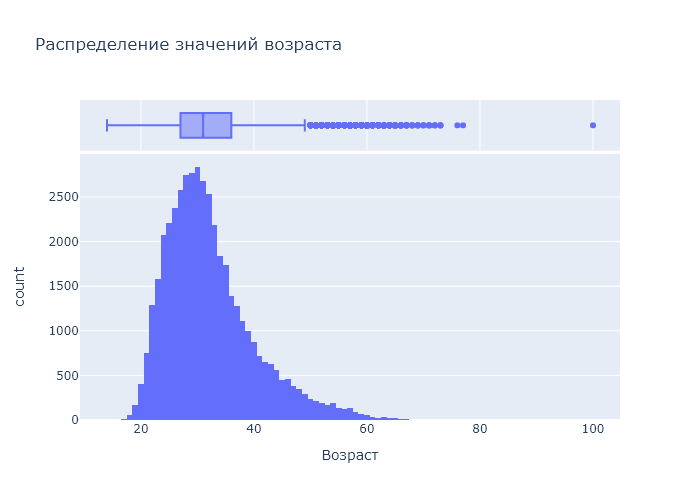

ваши выводы по графику здесь

*Мода распределения равна 30 годам.*   
*Половина значений лежит в интервале от 27 до 36, большинство значений находятся в промежутке от 14 до 49.*  
*Минимально значение равно 14 годам, что не противоречит законодательству РФ. Максимальный возраст равен 100 годам, что не является невозможным наблюдением.*  
*Вывод: по данному признаку аномалий не наблюдается*  

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [24]:
# ваш код здесь
fig = px.histogram(hh_df, x='Опыт работы (месяц)', marginal='box', title='Распределение опыта работы')
fig.show()
fig.write_html("plotly/html/2_hist_work_experience.html")
fig.write_image("plotly/png/2_hist_work_experience.png")

PNG version for github

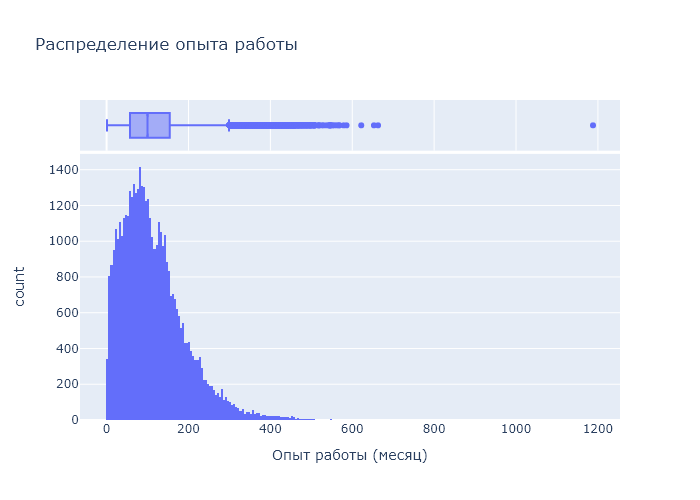

In [25]:
hh_df['Опыт работы (месяц)'].value_counts().index[0]

81.0

ваши выводы здесь

- *Мода распределения равна 81 месяцу*  
- *Большинство наблюдений находятся в интервале от 1 до 299 месяцев*  
- *Минимальный опыт работы равен 1 месяцу*  
- *Максимальный опыт работы равен 1188 месяцам или 99 годам. Так как максимальный возраст в выборке равен 100 годам, то данное значение опыта работы является выбросом*  
- *Вторым самым большим значением является 663 месяца или 55.25 лет, что не является невозможным наблюдением*  
- *Вывод: в данном признаке есть один выброс*

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [26]:
# ваш код здесь
fig = px.histogram(hh_df, x='ЗП (руб)', marginal='box', title='распределение заработных плат')
fig.show()
fig.write_html("plotly/html/3_hist_salary.html")
fig.write_image("plotly/png/3_hist_salary.png")

PNG version for github

In [27]:
fig = px.histogram(hh_df, x='ЗП (руб)', marginal='box', 
                   range_x=[-100, 1000000], nbins=5000, 
                   title='распределение заработных плат без учёта 5 самых больших значений')
fig.show()
fig.write_html("plotly/html/4_hist_salary_filtered.html")
fig.write_image("plotly/png/4_hist_salary_filtered.png")

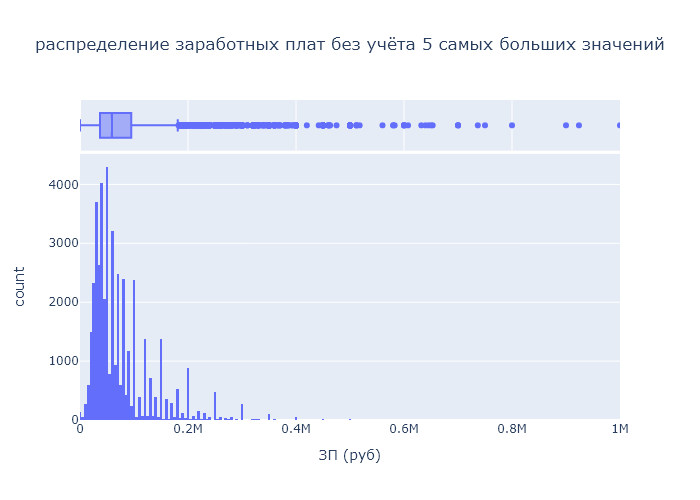

PNG version for github

In [28]:
# самые большие ЗП
salary = hh_df.copy()
salary = salary.sort_values('ЗП (руб)', ascending=False)
salary[['Ищет работу на должность:', 'Последнее/нынешнее место работы', 
        'Последняя/нынешняя должность', 'Образование', 'Опыт работы (месяц)', 'ЗП (руб)']].head(6)

,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование,Опыт работы (месяц),ЗП (руб)
6931,"Программирование, Разработка или Системный адм...","Евразийский банк, АО",Главный специалист Отдел разработки систем роз...,Высшее,115.0,24304876.0
39191,Специалист по IT,"ТОО ""AMS""",Системный администратор,Среднее специальное,98.0,7675224.0
28253,"Руководитель IT проектов, Роботизация, Автомат...",HAMSTER ROBOTICS,Заместитель директора,Высшее,280.0,3000000.0
43134,Chief AI Officer,Finnish Russian Univeristy Cooperation in Tele...,Project Manager in Multimedia Technologies,Высшее,97.0,2500000.0
41924,Project manager,Тинькофф Банк,Технолог автоматизации бизнес-процессов,Неоконченное высшее,39.0,1750000.0
32325,"Менеджер, Руководитель группы",ОТР 2000,Менеджер инцидентов,Высшее,42.0,1000000.0


In [29]:
# мода
salary['ЗП (руб)'].value_counts().head(1)

ЗП (руб)
50000.0    4064
Name: count, dtype: int64

In [30]:
salary_mask = salary['ЗП (руб)'] < 9500 
occupation_mask = salary['полная занятость'] == True
salary[salary_mask & occupation_mask]['ЗП (руб)'].count()

140

ваши выводы здесь

- *Мода распределения равна 50к рублей*  
- *Большинство значение находятся в промежутке от 1 рубля до 183к рублей*  
- *Максимальное значение ожидаемой ЗП равно 24 миллионам рублей. Это значение буду считать выбросом, так как для должности программиста, разработчика или сис. админа это не реалистичная ЗП*
- *Также считаю аномалиями и ошибками ЗП в 7 миллионов рублей для системного администратора со средним специальным образованием, как и зарплату в 1.7 миллионов с должностью Project manager с неоконченным высшим и опытом 3 года.*
- *На момент 2018 года минимальный размер оплаты труда составлял 9500 рублей в месяц, поэтому можно избавиться от резюме, где указана полная занятость и ЗП меньше 9500 рублей - таких резюме 140*

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

In [31]:
# ваш код здесь
grouped_edu = hh_df[hh_df['ЗП (руб)'] < 1000000]
grouped_edu = hh_df.groupby('Образование')['ЗП (руб)'].median().reset_index()
fig = px.bar(grouped_edu, x='Образование', y='ЗП (руб)', title='Зависимость медианной ЗП от образования')
fig.show()

fig.write_html("plotly/html/5_bar_salary_education_level.html")
fig.write_image("plotly/png/5_bar_salary_education_level.png")

PNG version for github

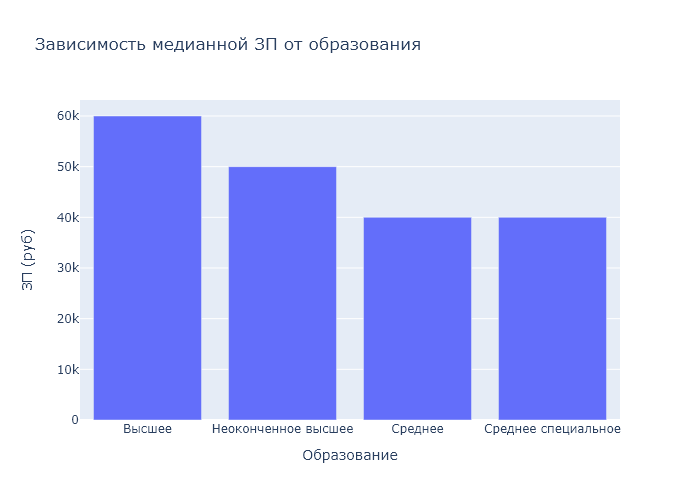

ваши выводы здесь

- *наибольшее медианное значение желанной ЗП наблюдается у резюме, в которых указано высшее образование, и наименьшее значение - в которых среднее специальное*
- *так как прослеживается определенная зависимость между желаемым уровем ЗП и уровнем образования: чем лучше образование, тем выше ЗП, то признак уровня образования является важным для прогнозирования желаемого уровня ЗП*

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

In [32]:
filtered_salary = hh_df[hh_df['ЗП (руб)'] < 1000000]
fig = px.histogram(filtered_salary, x='ЗП (руб)', color='Город', 
                   marginal='box', title='Распределения желаемой ЗП в разных городах',
                   nbins=200, width=1400, height=600)
fig.show()

fig.write_html("plotly/html/6_multihist_salary_city.html")
fig.write_image("plotly/png/6_multihist_salary_city.png")

PNG version for github

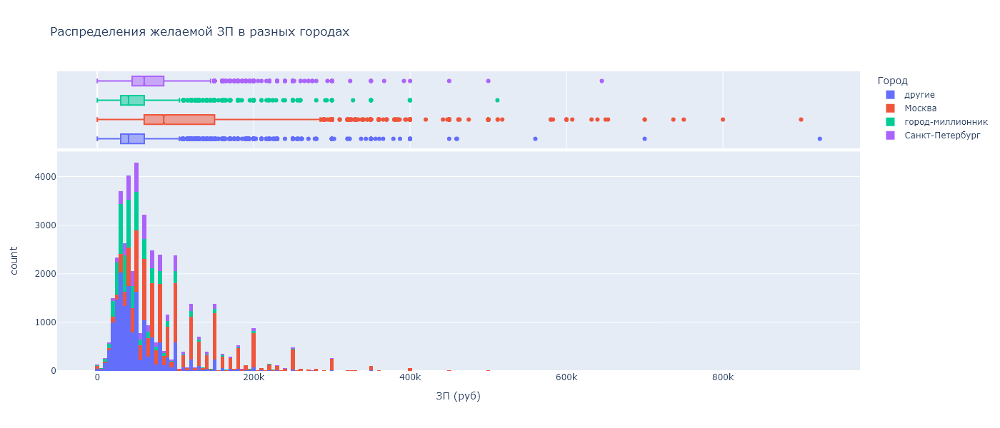

ваши выводы здесь

- *наибольший размах и наибольшее медианное значение желанной ЗП наблюдаются у резюме, где указаны города Москва и Санкт-Петербург, и наименьшее значения - где указаны города-миллионники и другие*
- *так как распределения желаемого уровня ЗП значительно меняются, в зависимости от города, то этот признак является важным для прогнозирования желаемого уровня ЗП*

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

In [33]:
# ваш код здесь
grouped_move = filtered_salary.groupby(['Готовность к переезду', 'Готовность к командировкам'])['ЗП (руб)'].median().reset_index()
fig = px.bar(grouped_move, y='ЗП (руб)', x='Готовность к командировкам', color='Готовность к переезду',
             barmode = 'group', title='зависимость медианной ЗП от готовности к коммандировкам и готовности к переезду')
fig.show()

fig.write_html("plotly/html/7_multibar_salary_moving.html")
fig.write_image("plotly/png/7_multibar_salary_moving.png")

PNG version for github

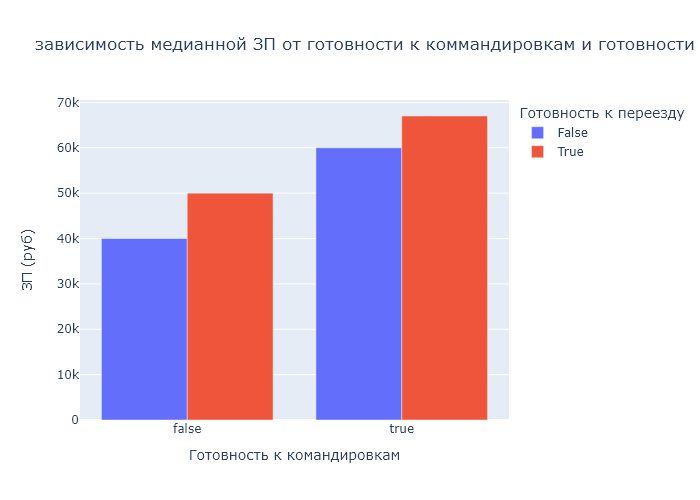

ваши выводы здесь

- *медианная ЗП с готовностью к коммандировкам значительно выше, чем медианная ЗП без готовности к коммандировкам.*
- *При одинаковой готовности к коммандировкам, резюме с готовностью к переезду имеют в среднем выше значения желаемой ЗП*

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

In [34]:
# ваш код здесь
grouped_edu_age = filtered_salary.groupby(['Возраст', 'Образование'])['ЗП (руб)'].median().unstack()
fig = px.imshow(grouped_edu_age, title='зависимость медианной зарплаты от образования и возраста')
fig.show()

fig.write_html("plotly/html/8_heatmap_salary_age_education.html")
fig.write_image("plotly/png/8_heatmap_salary_age_education.png")

PNG version for github

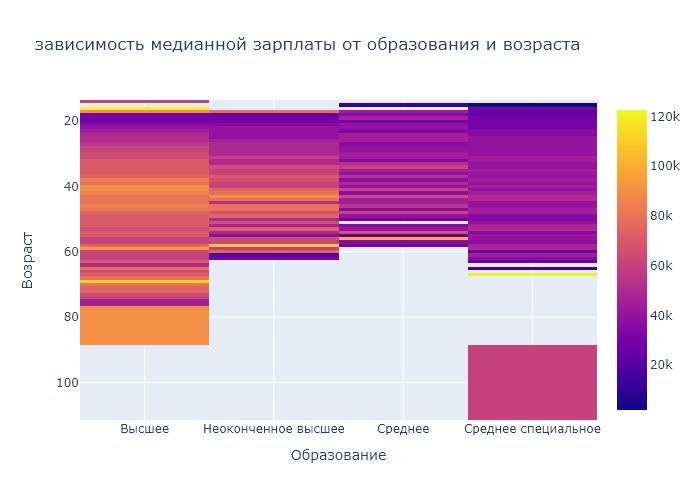

ваши выводы здесь

- *ЗП у людей со средним и средним специальным практически не меняется с течением времени*
- *ЗП у людей с неоконченным высшим и высшим растёт до 40 лет и постепенно снижается после*

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

In [35]:
# ваш код здесь
age_exp = filtered_salary[['Опыт работы (месяц)', 'Возраст']].copy()
age_exp['Опыт работы (год)'] = age_exp['Опыт работы (месяц)'].apply(lambda el: round(el/12, 3))
fig = px.scatter(age_exp, x='Возраст', y='Опыт работы (год)', title='зависимость опыта работы от возраста')
fig.add_shape(type="line", x0=0, y0=0, x1=100, y1=100)
fig.show()

fig.write_html("plotly/html/9_scatter_age_work_experience.html")
fig.write_image("plotly/png/9_scatter_age_work_experience.png")

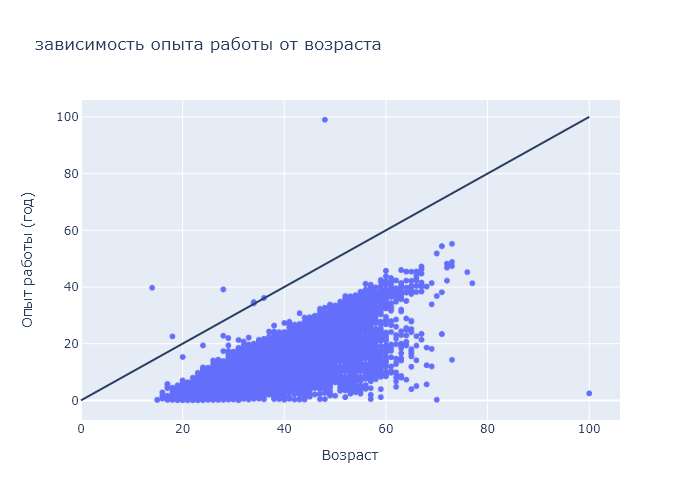

ваши выводы здесь

PNG version for github

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


ваши выводы здесь

# Очистка данных

In [36]:
cleaned_df = hh_df.copy()

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [37]:
# ваш код здесь
print('дубликатов до:', cleaned_df.duplicated().sum())
cleaned_df = cleaned_df.drop_duplicates()
print('дубликатов после:', cleaned_df.duplicated().sum())

дубликатов до: 161
дубликатов после: 0


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [38]:
# ваш код здесь
cleaned_df.isna().sum()

Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
волонтёрство                         0
стажировка                           0
полный день                          0
сменный график                       0
гибкий график                        0
удалённая работа                     0
вахтовый метод                       0
ЗП (руб)                             0
dtype: int64

3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [39]:
# ваш код здесь
cleaned_df = cleaned_df.dropna(subset=['Последнее/нынешнее место работы', 'Последняя/нынешняя должность'])
cleaned_df = cleaned_df.fillna(cleaned_df['Опыт работы (месяц)'].median())
print('кол-во пропусков после преобразования:', cleaned_df.isna().sum().sum())

кол-во пропусков после преобразования: 0


In [40]:
# Чему равно результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков? Ответ округлите до целых
cleaned_df['Опыт работы (месяц)'].mean()

114.35777573405711

4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [41]:
# ваш код здесь
drop_index = cleaned_df[(cleaned_df['ЗП (руб)'] < 1000) | (cleaned_df['ЗП (руб)'] > 1000000)].index
cleaned_df = cleaned_df.drop(index=drop_index)

In [42]:
# Сколько выбросов вы нашли?
len(drop_index)

89

5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [43]:
# ваш код здесь
drop_index = cleaned_df[(cleaned_df['Опыт работы (месяц)']/12 > cleaned_df['Возраст'])].index
cleaned_df = cleaned_df.drop(index=drop_index)

In [44]:
# Сколько выбросов вы нашли?
len(drop_index)

7

6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

In [45]:
# ваш код здесь
hh_df['log_age'] = np.log(hh_df['Возраст'] + 1)

mu = hh_df['log_age'].mean()
sigma = hh_df['log_age'].std()
left_border = mu - 3*sigma
right_border = mu + 4*sigma

fig = px.histogram(hh_df, x='log_age', marginal='box', title='Распределение возраста в логарифмическом масштабе',
                   labels={'log_age': 'Возраст в логарифмическом масштабе'})
fig.add_vline(x=left_border, line_width=3, line_dash="dash")
fig.add_vline(x=right_border, line_width=3, line_dash="dash")
fig.add_vline(x=mu, line_width=3, line_dash="dash")
fig.show()

fig.write_html("plotly/html/10_hist3sigma_age.html")
fig.write_image("plotly/png/10_hist3sigma_age.png")

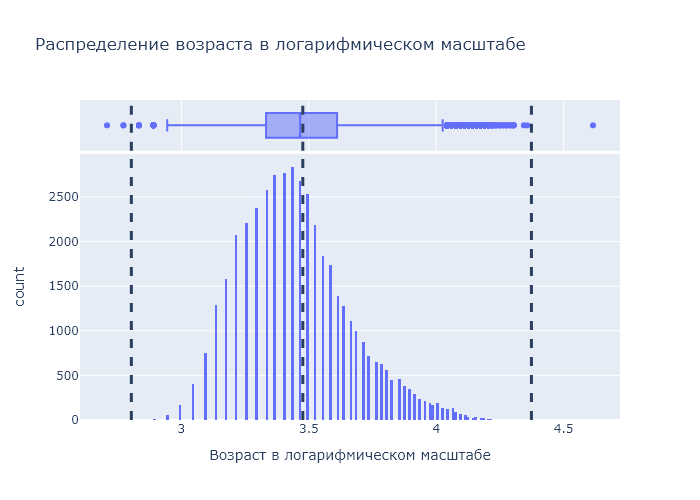

PNG version for github

In [46]:
hh_df[(hh_df['log_age'] < left_border) | (hh_df['log_age'] > right_border)]

,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,...,проектная работа,волонтёрство,стажировка,полный день,сменный график,гибкий график,удалённая работа,вахтовый метод,ЗП (руб),log_age
29098,Ведущий инженер-программист,"КБ Аметист, Концерн АГАТ",Ведущий инженер-программист,2019-04-26,Не указано,Высшее,М,14,477.0,Москва,...,False,False,False,True,False,False,False,False,60000.0,2.708050
31137,Менеджер по работе с клиентами,"ООО ""ФёрстКэшКомпани""",Менеджер по работе с клиентами,2019-04-06,Не указано,Среднее,М,15,2.0,Санкт-Петербург,...,False,False,False,False,True,True,False,False,10000.0,2.772589
32950,Тестировщик игр,OOO ЖМЫХ,Тестировщик ПО,2019-04-09,Не указано,Среднее специальное,М,15,3.0,другие,...,False,False,False,True,False,False,False,False,2000.0,2.772589
33654,Frontend-разработчик,Freelance,Frontend-разработчик,2019-04-19,Не указано,Среднее специальное,М,100,30.0,Санкт-Петербург,...,True,False,True,True,False,True,False,False,60000.0,4.615121


ваш коммментарий здесь

- *Распределение имеет правостороннюю ассиметрию*
- *под категорию выбросов попали резюме, где указаны возрасты 14, 15 и 100 лет*